In [1]:
import matplotlib.pyplot as plt
# os.chdir('/pfs/data6/home/ma/ma_ma/ma_kreffert/Probabilistic_LTSF/notebooks/BasicTS/')
from utils import init, get_predictions, validate, load_data
import os
os.chdir('/home/kreffert/Probabilistic_LTSF/BasicTS/')
from basicts.data import TimeSeriesForecastingDataset
from basicts.utils import get_regular_settings

data_sets = load_data()

Validation dataset is too short, enabling overlap. See details in /home/kreffert/Probabilistic_LTSF/BasicTS/basicts/data/simple_tsf_dataset.py at line 96.
Training dataset is too short, enabling overlap. See details in /home/kreffert/Probabilistic_LTSF/BasicTS/basicts/data/simple_tsf_dataset.py at line 96.
Validation dataset is too short, enabling overlap. See details in /home/kreffert/Probabilistic_LTSF/BasicTS/basicts/data/simple_tsf_dataset.py at line 96.
Test dataset is too short, enabling overlap. See details in /home/kreffert/Probabilistic_LTSF/BasicTS/basicts/data/simple_tsf_dataset.py at line 96.


In [2]:
import torch
def create_data(input_tensor, input_length=96, output_length=720, moving_window=False):
    '''Create non overlapping prediction windows.'''
    length = input_length+output_length
    if moving_window:
        length = input_length
        offset = output_length
    else:
        length = input_length + output_length
        offset = 0
    max_series = int(input_tensor.shape[0]/(length))
    inputs, targets = [], []
    for l in range(max_series):
        start = length * l
        midpoint = start + length
        end = start + length + offset
        if end > input_tensor.shape[0]:  # Skip if out-of-bounds
            continue
        inputs.append(torch.tensor(input_tensor[start:midpoint, :, 0]))
        targets.append(torch.tensor(input_tensor[midpoint:end, :, 0]))
    
    return {'inputs':torch.stack(inputs, dim=0), 'target': torch.stack(targets, dim=0)}
data = create_data(data_sets["ETTm1"]["train"].data, input_length=96, output_length=96, moving_window=True)
all_inputs, all_targets = data['inputs'], data['target']
print(all_inputs.shape)

torch.Size([359, 96, 7])


In [3]:
import torch
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from tqdm import tqdm

def cluster_by_last_dim(
    tensor: torch.Tensor,
    n_clusters: int = 10,
    metric: str = "cosine",
    return_rankings: bool = False,
    reference_idx: int = 0,
):
    """
    Cluster tensor elements independently for each dimension in the last axis.

    Args:
        tensor: Input tensor of shape [N, M, D] (e.g., [7825, 96, 7]).
        n_clusters: Number of clusters to compute (default: 10).
        metric: Similarity metric ("cosine" or "euclidean").
        return_rankings: If True, returns similarity rankings for a reference.
        reference_idx: Index of reference element for rankings (default: 0).

    Returns:
        If return_rankings=False:
            Dict {dim_i: cluster_labels} where cluster_labels is array[N].
        If return_rankings=True:
            Dict {dim_i: ranked_indices} where ranked_indices is array[N].
    """
    # Convert tensor to numpy if needed
    if isinstance(tensor, torch.Tensor):
        data = tensor.numpy()
    else:
        data = tensor

    results = {}

    for i in range(data.shape[-1]):  # Iterate over last dimension (D=7)
        slice_i = data[:, :, i]  # Shape [N, M]

        if return_rankings:
            # Compute similarity rankings for reference element
            if metric == "cosine":
                sim = cosine_similarity(slice_i[reference_idx : reference_idx + 1], slice_i)[0]
            elif metric == "euclidean":
                dist = np.linalg.norm(slice_i - slice_i[reference_idx], axis=1)
                sim = -dist  # Convert distance to "similarity" (higher = closer)
            else:
                raise ValueError(f"Unsupported metric: {metric}")

            ranked_indices = np.argsort(-sim)  # Descending order
            results[f"dim_{i}"] = ranked_indices

        else:
            # Perform clustering
            if metric == "cosine":
                # Normalize for cosine KMeans (optional but recommended)
                norms = np.linalg.norm(slice_i, axis=1, keepdims=True)
                normalized = slice_i / np.where(norms == 0, 1e-10, norms)
                kmeans = KMeans(n_clusters=n_clusters, random_state=42)
                cluster_labels = kmeans.fit_predict(normalized)
            elif metric == "euclidean":
                kmeans = KMeans(n_clusters=n_clusters, random_state=42)
                cluster_labels = kmeans.fit_predict(slice_i)
            else:
                raise ValueError(f"Unsupported metric: {metric}")

            results[f"dim_{i}"] = cluster_labels

    return results
def analyze_similarity(
    tensor: torch.Tensor,
    n_clusters: int = 10,
    metric: str = "cosine",
    top_k_pairs: int = 10,
    return_clusters: bool = True,
    return_ranked_pairs: bool = True,
):
    """
    Analyze similarity across the last dimension of a tensor, with options for clustering and pairwise rankings.

    Args:
        tensor: Input tensor of shape [N, M, D] (e.g., [7825, 96, 7]).
        n_clusters: Number of clusters (if return_clusters=True).
        metric: "cosine" or "euclidean".
        top_k_pairs: Number of top similar pairs to return (if return_ranked_pairs=True).
        return_clusters: If True, returns cluster labels for each dimension.
        return_ranked_pairs: If True, returns top similar pairs for each dimension.

    Returns:
        Dict with keys:
            - "clusters": Dict {dim_i: cluster_labels} (if return_clusters=True).
            - "ranked_pairs": Dict {dim_i: [(score, (idx_a, idx_b)), ...]} (if return_ranked_pairs=True).
    """
    if isinstance(tensor, torch.Tensor):
        data = tensor.numpy()
    else:
        data = tensor

    results = {}
    if return_clusters:
        results["clusters"] = {}
    if return_ranked_pairs:
        results["ranked_pairs"] = {}

    for i in tqdm(range(data.shape[-1]), desc="Clustering"):
        slice_i = data[:, :, i]  # Shape [N, M]

        # --- Clustering ---
        if return_clusters:
            if metric == "cosine":
                norms = np.linalg.norm(slice_i, axis=1, keepdims=True)
                normalized = slice_i / np.where(norms == 0, 1e-10, norms)
                kmeans = KMeans(n_clusters=n_clusters, random_state=42)
                cluster_labels = kmeans.fit_predict(normalized)
            elif metric == "euclidean":
                kmeans = KMeans(n_clusters=n_clusters, random_state=42)
                cluster_labels = kmeans.fit_predict(slice_i)
            else:
                raise ValueError(f"Unsupported metric: {metric}")
            results["clusters"][f"dim_{i}"] = cluster_labels

        # --- Pairwise Similarity Rankings ---
        if return_ranked_pairs:
            if metric == "cosine":
                sim_matrix = cosine_similarity(slice_i)  # Shape [N, N]
                # Ignore self-similarity (diagonal)
                np.fill_diagonal(sim_matrix, -np.inf)
            elif metric == "euclidean":
                dist_matrix = euclidean_distances(slice_i)
                sim_matrix = -dist_matrix  # Convert to "similarity" (higher = closer)
                np.fill_diagonal(sim_matrix, -np.inf)
            else:
                raise ValueError(f"Unsupported metric: {metric}")

            # Find top-k pairs
            flat_indices = np.argsort(sim_matrix.ravel())[::-1][:top_k_pairs]
            pairs = np.unravel_index(flat_indices, sim_matrix.shape)
            ranked_pairs = [
                (sim_matrix[pairs[0][k], pairs[1][k]], (pairs[0][k], pairs[1][k]))
                for k in range(top_k_pairs)
            ]
            results["ranked_pairs"][f"dim_{i}"] = ranked_pairs

    return results

In [6]:
import torch
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, pairwise_distances
from tslearn.metrics import cdist_dtw
from scipy.fft import fft

def autocorr_distance(X, lag=20):
    def acf(x):
        x = (x - np.mean(x)) / (np.std(x) + 1e-10)
        return np.correlate(x, x, mode='full')[len(x)-1:] / len(x)
    acfs = np.array([acf(x)[:lag] for x in X])
    return pairwise_distances(acfs, metric="euclidean")

def fourier_distance(X, n_coeffs=20):
    fft_features = np.abs(fft(X))[:, :n_coeffs]
    return pairwise_distances(fft_features, metric="euclidean")

def compute_distance_matrix(X, metric):
    if metric == "euclidean" or metric == "cosine":
        return pairwise_distances(X, metric=metric)
    elif metric == "dtw":
        return cdist_dtw(X)
    elif metric == "autocorr":
        return autocorr_distance(X)
    elif metric == "fourier":
        return fourier_distance(X)
    else:
        raise ValueError(f"Unsupported metric: {metric}")

def cluster_by_last_dim(
    tensor: torch.Tensor,
    targets: torch.Tensor,
    n_clusters: int = None,
    metric: str = "cosine",
    return_rankings: bool = False,
    reference_idx: int = 0,
    max_clusters: int = 10,
    diversity_metric: str = "cosine"
):
    if isinstance(tensor, torch.Tensor):
        data = tensor.numpy()
    if isinstance(targets, torch.Tensor):
        targets = targets.numpy()

    results = {}

    for i in range(data.shape[-1]):
        slice_i = data[:, :, i]
        target_i = targets[:, :, i]

        if return_rankings:
            dist_matrix = compute_distance_matrix(slice_i, metric)
            sim = -dist_matrix[reference_idx]
            results[f"dim_{i}"] = np.argsort(-sim)
        else:
            # Optional: normalize if cosine
            if metric == "cosine":
                norms = np.linalg.norm(slice_i, axis=1, keepdims=True)
                X = slice_i / (norms + 1e-10)
            else:
                X = slice_i

            if metric in ["dtw", "autocorr", "fourier"]:
                # Use precomputed distance matrix with KMeans is not supported directly.
                # Instead, use distance matrix for diversity only.
                X_kmeans = slice_i
            else:
                X_kmeans = X

            if n_clusters is None:
                best_score = -1
                best_k = 2
                for k in range(2, max_clusters + 1):
                    try:
                        kmeans = KMeans(n_clusters=k, random_state=42).fit(X_kmeans)
                        score = silhouette_score(X_kmeans, kmeans.labels_)
                        if score > best_score:
                            best_score = score
                            best_k = k
                    except:
                        continue
                n = best_k
            else:
                n = n_clusters

            kmeans = KMeans(n_clusters=n, random_state=42).fit(X_kmeans)
            labels = kmeans.labels_
            results[f"dim_{i}"] = labels

            # Compute diversity in targets
            cluster_diversity = {}
            for c in np.unique(labels):
                indices = np.where(labels == c)[0]
                if len(indices) > 1:
                    pairwise_dists = compute_distance_matrix(target_i[indices], diversity_metric)
                    avg_dist = np.mean(pairwise_dists)
                else:
                    avg_dist = 0
                cluster_diversity[f"cluster_{c}"] = avg_dist
            results[f"dim_{i}_diversity"] = cluster_diversity

    return results

# ETTh1

/tmp/ipykernel_2339573/1963849344.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs.append(torch.tensor(input_tensor[start:midpoint, :, 0]))
/tmp/ipykernel_2339573/1963849344.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  targets.append(torch.tensor(input_tensor[midpoint:end, :, 0]))


torch.Size([142, 96, 7])


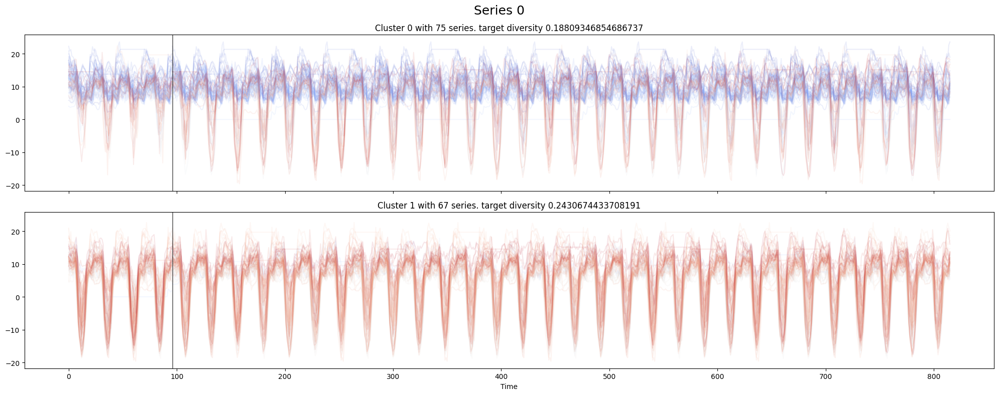

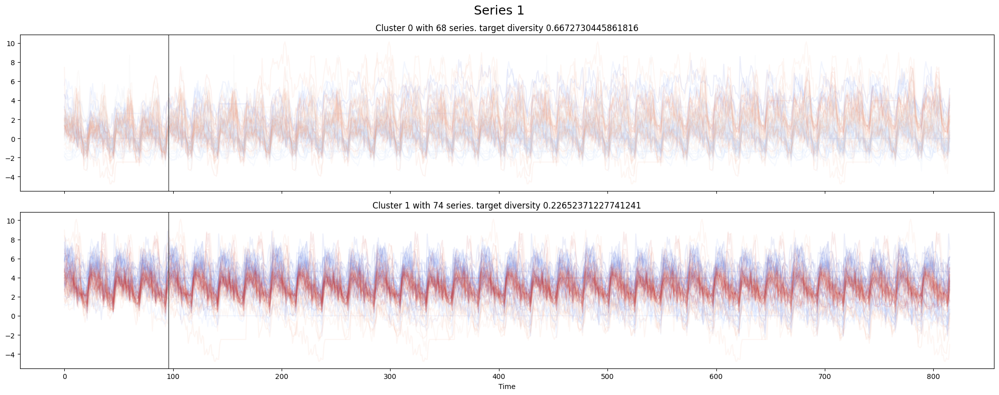

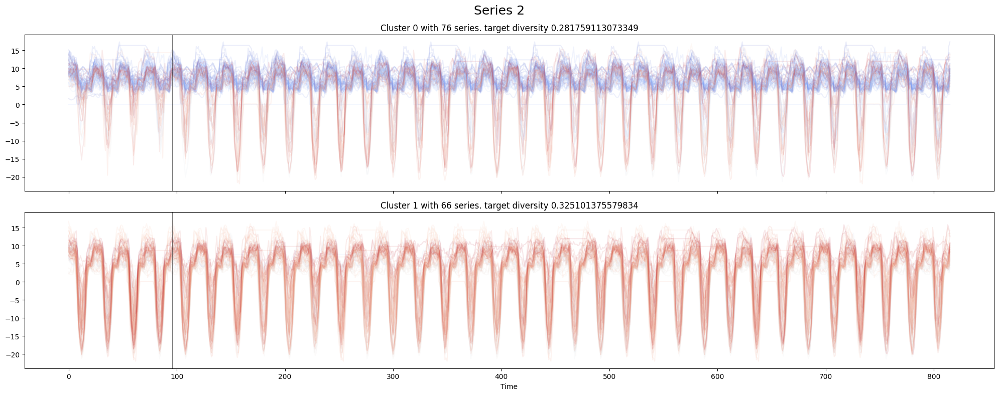

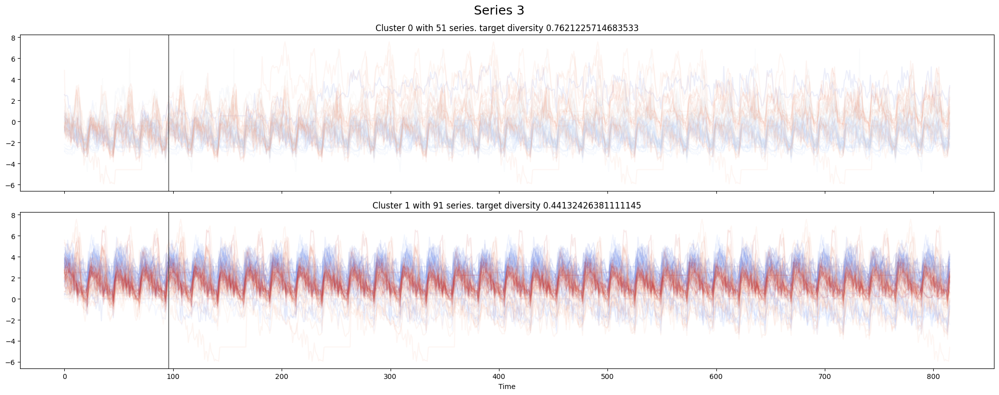

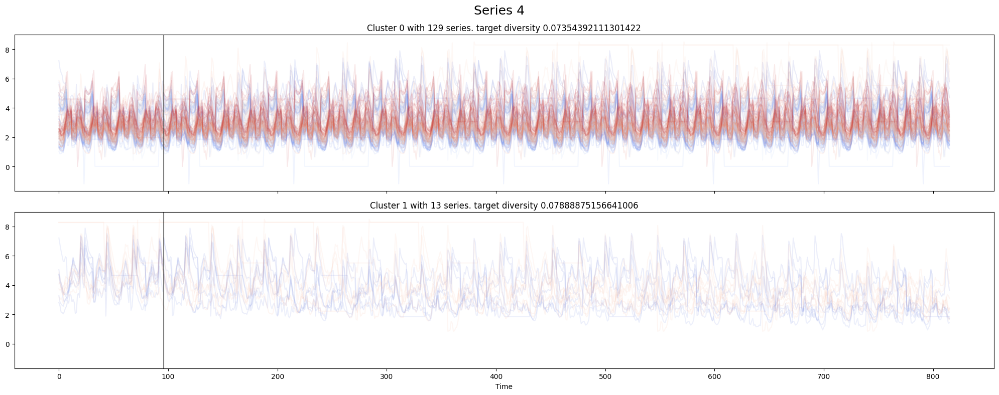

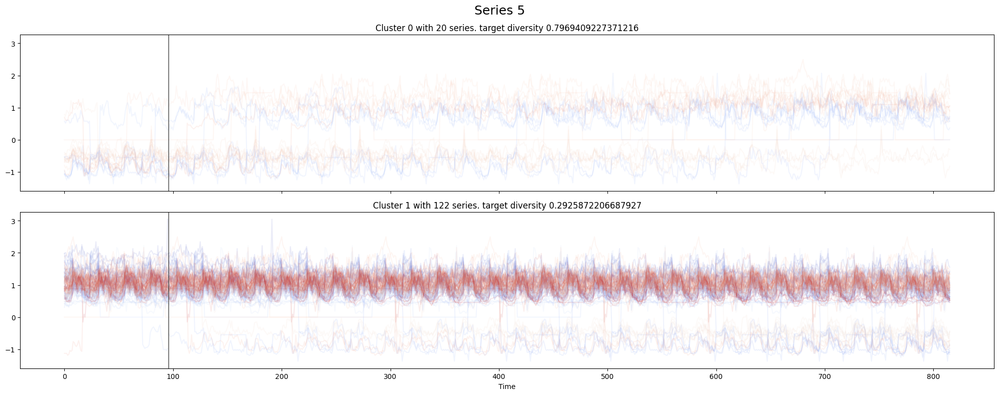

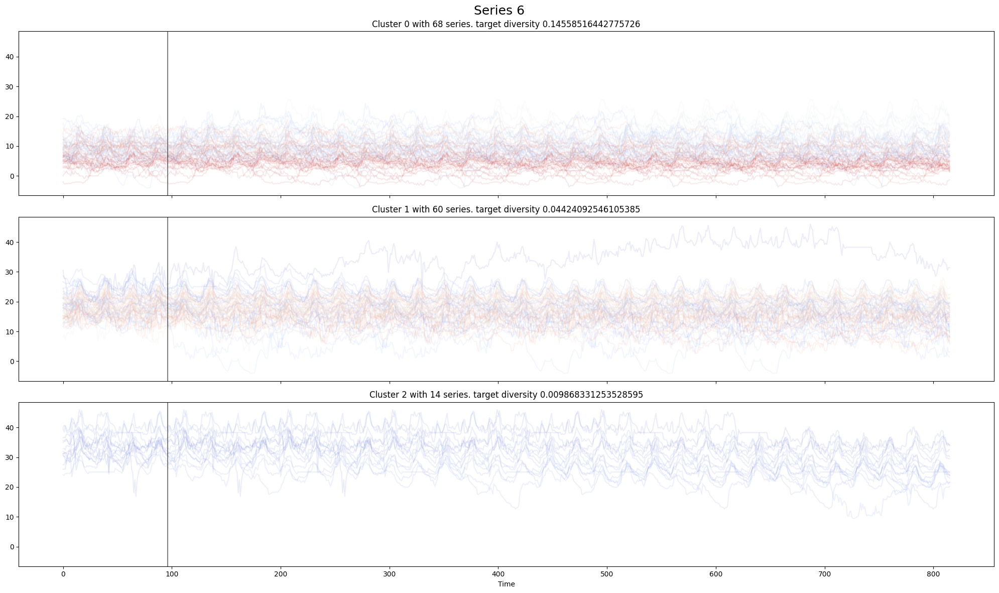

In [11]:
cmap = plt.cm.coolwarm

from collections import Counter
# "ETTh1", "ETTh2", "ETTm1", "ETTm2", "Traffic", "Weather", "ExchangeRate", "Illness"
dataset, input_length, output_length = 'ETTh1', 96, 720 #144
input_tensor = torch.cat([torch.tensor(data_sets[dataset]["train"].data), 
           torch.tensor(data_sets[dataset]["val"].data), 
           torch.tensor(data_sets[dataset]["test"].data)],dim=0)
data = create_data(input_tensor, input_length=input_length, output_length=output_length, moving_window=True)
all_inputs, all_targets = data['inputs'], data['target']
print(all_inputs.shape)
results = cluster_by_last_dim(
    all_inputs,
    all_targets,
    metric="fourier",
)
for dim in range(min(7, all_inputs.shape[-1])):
    clusters = results[f'dim_{dim}']
    num_clusters = max(clusters) + 1
    colors = ['red', 'green', 'blue', 'black', 'grey', 'purple', 'orange']
    
    fig, axes = plt.subplots(num_clusters, 1, figsize=(20, 4 * num_clusters), sharex=True, sharey=True)
    num_lines = all_inputs.shape[0]
    for i in range(num_clusters):
        ax = axes[i]
        indices = np.where(clusters == i)[0]
        for j in indices:
            color = cmap(j / num_lines)
            ax.plot(range(all_inputs.shape[1]), all_inputs[j, :, dim], color=color, alpha=0.1)#colors[i % len(colors)], alpha=0.1)
            ax.plot(range(all_inputs.shape[1], all_inputs.shape[1]+output_length), all_targets[j, :output_length, dim], color=color, alpha=0.1)#color=colors[i % len(colors)], alpha=0.1)
        ax.set_title(f'Cluster {i} with {len(indices)} series. target diversity {results[f"dim_{dim}_diversity"][f"cluster_{i}"]}')
        ax.axvline(all_inputs.shape[1], color='black', alpha=0.5)
    
    plt.xlabel('Time')
    fig.suptitle(f"Series {dim}", fontsize=18)
    plt.tight_layout()
    plt.show()

# ETTm1

/tmp/ipykernel_2339573/1963849344.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs.append(torch.tensor(input_tensor[start:midpoint, :, 0]))
/tmp/ipykernel_2339573/1963849344.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  targets.append(torch.tensor(input_tensor[midpoint:end, :, 0]))


torch.Size([592, 96, 7])


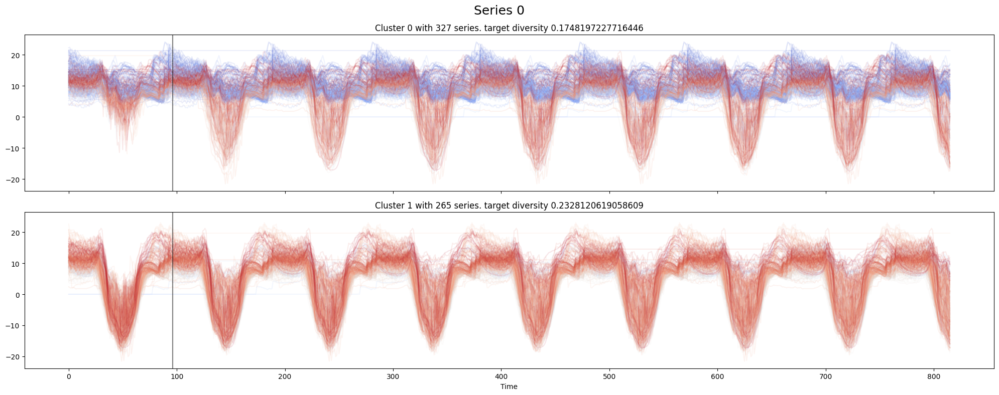

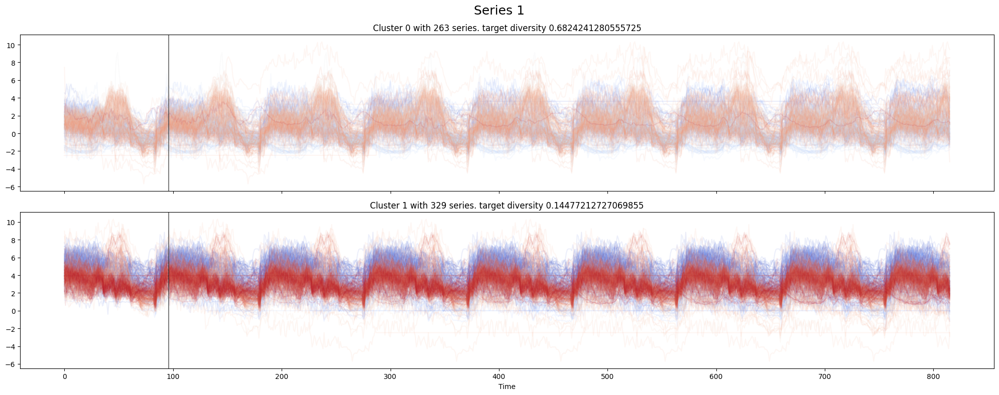

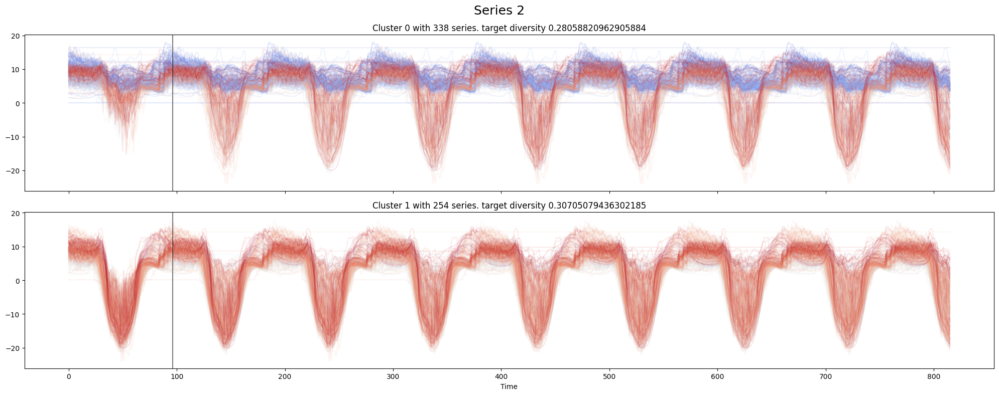

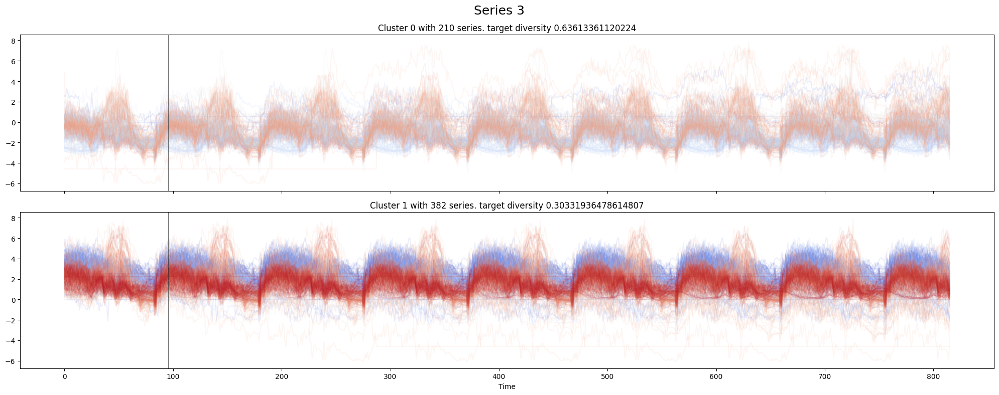

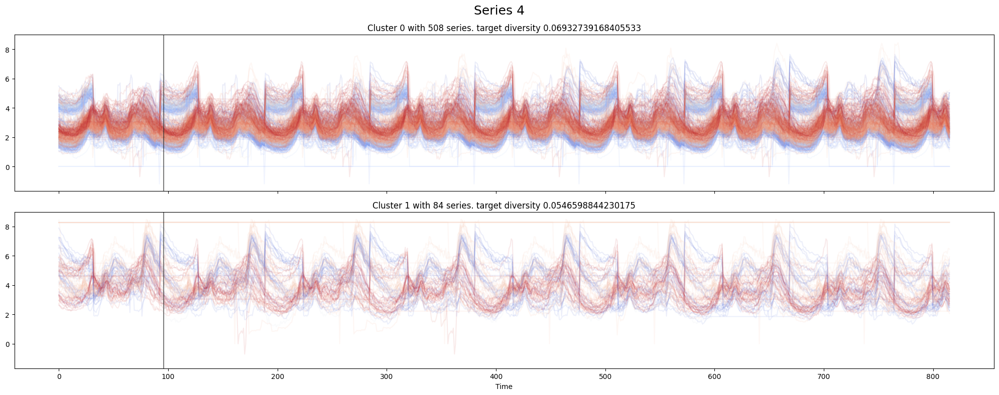

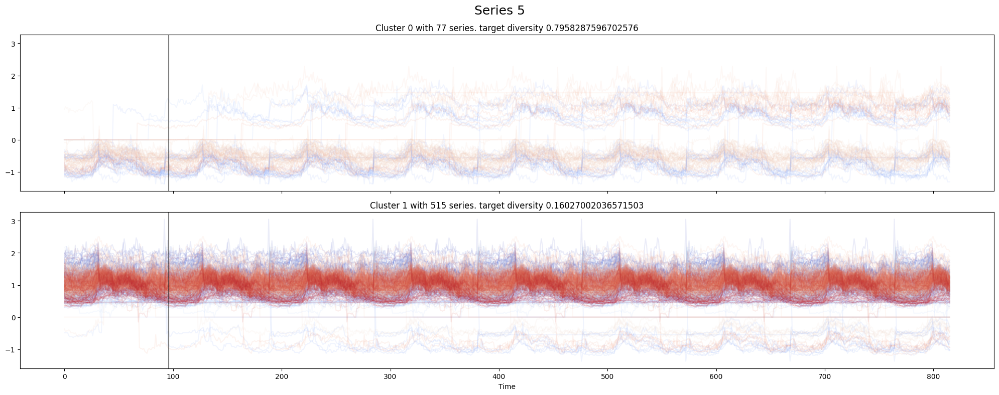

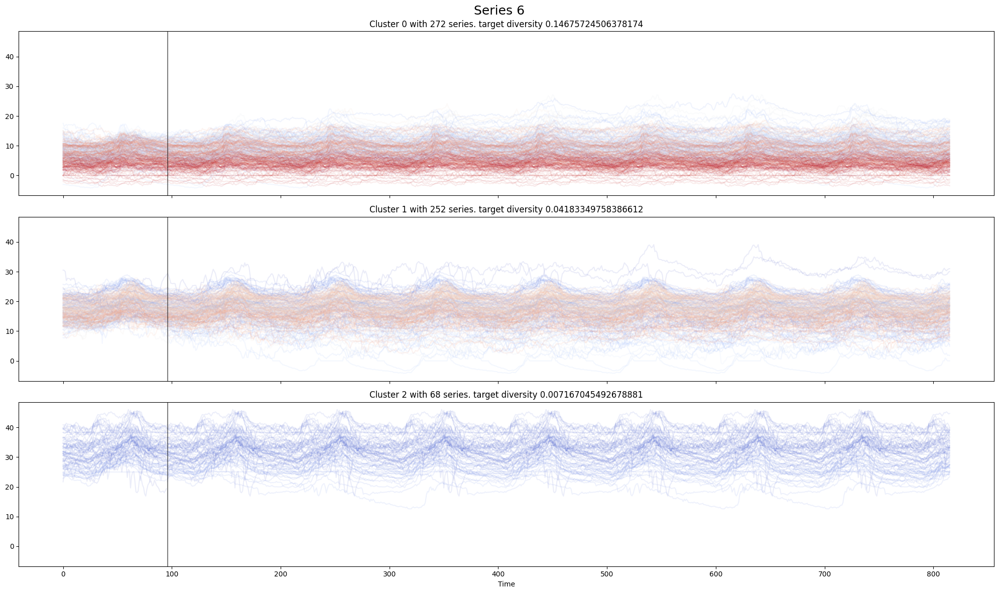

In [12]:
cmap = plt.cm.coolwarm

from collections import Counter
# "ETTh1", "ETTh2", "ETTm1", "ETTm2", "Traffic", "Weather", "ExchangeRate", "Illness"
dataset, input_length, output_length = 'ETTm1', 96, 720 #144
input_tensor = torch.cat([torch.tensor(data_sets[dataset]["train"].data), 
           torch.tensor(data_sets[dataset]["val"].data), 
           torch.tensor(data_sets[dataset]["test"].data)],dim=0)
data = create_data(input_tensor, input_length=input_length, output_length=output_length, moving_window=True)
all_inputs, all_targets = data['inputs'], data['target']
print(all_inputs.shape)
results = cluster_by_last_dim(
    all_inputs,
    all_targets,
    metric="fourier",
)
for dim in range(min(7, all_inputs.shape[-1])):
    clusters = results[f'dim_{dim}']
    num_clusters = max(clusters) + 1
    colors = ['red', 'green', 'blue', 'black', 'grey', 'purple', 'orange']
    
    fig, axes = plt.subplots(num_clusters, 1, figsize=(20, 4 * num_clusters), sharex=True, sharey=True)
    num_lines = all_inputs.shape[0]
    for i in range(num_clusters):
        ax = axes[i]
        indices = np.where(clusters == i)[0]
        for j in indices:
            color = cmap(j / num_lines)
            ax.plot(range(all_inputs.shape[1]), all_inputs[j, :, dim], color=color, alpha=0.1)#colors[i % len(colors)], alpha=0.1)
            ax.plot(range(all_inputs.shape[1], all_inputs.shape[1]+output_length), all_targets[j, :output_length, dim], color=color, alpha=0.1)#color=colors[i % len(colors)], alpha=0.1)
        ax.set_title(f'Cluster {i} with {len(indices)} series. target diversity {results[f"dim_{dim}_diversity"][f"cluster_{i}"]}')
        ax.axvline(all_inputs.shape[1], color='black', alpha=0.5)
    
    plt.xlabel('Time')
    fig.suptitle(f"Series {dim}", fontsize=18)
    plt.tight_layout()
    plt.show()